LE611 - Pesquisa Operacional II

Projeto 2 - Logística da Soja


---




Integrantes do grupo:
- Augusto Chebel Machado (RA: 231762)
- João Pedro Marretto Helmeister (RA: 174564)
- Lucas Massabni Busnardo (RA: 182516)
- Lucas Tramonte (RA: 182697)
- Nathan Czelusniak de Siqueira (RA: 186041)
- Vinicius Consentino Muniz (RA: 245271)


---



# 1. Mapa de contorno

In [ ]:
# https://medium.com/@louisartur53/an%C3%A1lise-e-visualiza%C3%A7%C3%A3o-espacial-de-dados-reais-em-python-com-folium-cd4650fc5930

# importando as bibliotecas
import folium
import requests
# criando uma variável para o mapa do Brasil
mapa_brasil = folium.Map(location=[-22.7864889,-50.6786708],zoom_start=4,
                           tiles='Stamen Toner')

# API do IBGE - simulando um navegador de internet
headers = {
    'Content-Type': 'application/json;charset=UTF-8',
    'User-Agent': 'google-colab',
    'Accept': 'application/json, text/plain, */*',
    'Accept-Encoding': 'gzip, deflate, br',
    'Accept-Language': 'pt-BR,pt;q=0.9,en-US;q=0.8,en;q=0.7',
    'Connection': 'keep-alive',
}

# extraindo os dados de georeferenciamento do IBGE para os municípios de MT
#utilizando a versão V3, a qual está atualizada com os nomes dos municípios
municipios_jsons = requests.get("https://servicodados.ibge.gov.br/api/v3/malhas/estados/MT?formato=application/vnd.geo+json&intrarregiao=municipio",
                           headers=headers) #Formato de dicionários

# dados de georeferenciamento
municipios_json = municipios_jsons.json()
# municipios_json

In [ ]:
# adicionando os dados georeferenciados ao mapa do Brasil
#folium reconhece os contornos no formato json e faz os desenhos correspondentes no mapa
folium.GeoJson(municipios_json).add_to(mapa_brasil)

# plotando o mapa com os contornos dos municípios de MT
mapa_brasil

# 2. Dados de produção de soja

In [ ]:
# fonte: http://www.sedec.mt.gov.br/-/14352337-producao-de-graos-por-municipio
# SEDEC: Secretaria de Estado de Desenvolvimento Econômico - Governo do Mato Grosso

# importando o pandas para leitura dos dados
import pandas as pd

# realizando a leitura da planilha disponível na url e removendo algumas linhas que não serão úteis
url = 'http://www.sedec.mt.gov.br/documents/195466/14352713/Safra+Janeiro+2022.xlsx/e862c35a-2506-62c6-9d1b-cbdc5cd789c4'
dfs = pd.read_excel(url, sheet_name='SOJA', skiprows=[0,1,2,3,4,5,6,7], index_col=None, skipfooter=1)

# se na planilha tiver NaN: substituir pelo valor 0
dfs= dfs.fillna(0)

# tornando os códigos dos munícipios como indíce da tabela
dfs.CÓDIGO=(dfs.CÓDIGO).apply(str)
dfs.index=dfs.CÓDIGO

# renomeando a coluna de produção
dfs = dfs.rename(columns = {'PRODUÇÃO OBTIDA (TON.)':'PRODUÇÃO'})

dfs

,MUNICÍPIOS,CÓDIGO,ARÉA COLHIDA (HA),PRODUÇÃO,RENDIMENTO MÉDIO OBTIDO (KG/HA)
CÓDIGO,,,,,
5100102,Acorizal (MT),5100102,0.0,0.0,0.000000
5100201,Água Boa (MT),5100201,190000.0,684000.0,3600.000000
5100250,Alta Floresta (MT),5100250,31744.0,107930.0,3400.012601
5100300,Alto Araguaia (MT),5100300,45000.0,153900.0,3420.000000
5100359,Alto Boa Vista (MT),5100359,31500.0,122850.0,3900.000000
...,...,...,...,...,...
5108352,Vale de São Domingos (MT),5108352,0.0,0.0,0.000000
5108402,Várzea Grande (MT),5108402,0.0,0.0,0.000000
5108501,Vera (MT),5108501,156000.0,524160.0,3360.000000


# 3. Associando os dados de produção com os de georeferenciamento

In [ ]:
index = dfs.index

for state in municipios_json['features']:
  # Converter de string para número (usado no índice da tabela com produção).
  codarea = state['properties']['codarea']
  # Busca do código de área no índice da linha da Tabela.
  if codarea in index:
    #print(dfs.loc[codarea,'PRODUÇÃO'])
    state['properties']['PRODUÇÃO'] = float(dfs.loc[codarea,'PRODUÇÃO'])
  else:
    state['properties']['PRODUÇÃO'] = 0.0

# municipios_json

# 4. Mapa de cores para a produção de cada município

In [ ]:
# criando uma escala de cores personalizada
# critério: associar cada intervalo de produção a uma cor
myscale = (dfs['PRODUÇÃO'].quantile((0,0.2,0.4,0.6,0.8,1))).tolist()

# importando a biblioteca para utilizar a escala e criar o colormap
import branca.colormap as cm

# associando cada intervalo a uma cor
colormap = cm.LinearColormap(colors=['blue','green','yellow','orange','red','purple'], index=myscale,vmin=0.0,vmax=max(myscale))

# mostrando a escala de cores criada
colormap

In [ ]:
# associando a produção de soja de cada município à cor da escala
import folium

# criando o mapa
map = folium.Map(
    location=[-13.089461610967666, -55.910299337040286], zoom_start = 6,
    tiles='stamentoner'
)

# determinando que a escala vai ser aplicável à 'PRODUÇÃO'
fgp = folium.FeatureGroup(name='PRODUÇÃO')
tooltip=folium.features.GeoJsonTooltip(
        fields=['codarea','PRODUÇÃO'],
        aliases=['codarea','PRODUÇÃO'],
        style=("background-color: white; color: #333333; font-family: arial; font-size: 12px; padding: 10px;")
)

# associando os dados com as cores (style_function)
fgp.add_child(folium.GeoJson(data=municipios_json,
                             tooltip=tooltip,
                             style_function = lambda x:{'fillColor':colormap(x['properties']['PRODUÇÃO']),
                                                      'fillcolor':'#black','fillOpacity':0.8,'weight':0.8}))

# plotando o mapa e criando uma camada para ligar/desligar o mapa de cores
# mapa interativo - passa o mouse e mostra a produção em cada município
map.add_child(fgp)
map.add_child(folium.LayerControl())
map

# 5. Leitura de dados que fornecem cidades candidatas à HUBs e a portos

In [ ]:
# importando pandas para leitura dos arquivos
import pandas as pd

# url da planilha online (HUBs)
url_hubs = 'https://docs.google.com/spreadsheets/d/1PJspSmlR66-fW_onpDUf_k7fZkkEhMAhq4AXj1T9ims/export?format=xlsx'

# centros de distribuição (HUBs)
hubs = pd.read_excel(url_hubs)
hubs

,nome
0,Alta Floresta
1,Vila Bela da Santíssima Trindade
2,Alto Garças
3,Cáceres
4,Nortelândia
5,Sorriso
6,Nova Maringá
7,Brasnorte
8,Canarana
9,Nova Canaã do Norte


In [ ]:
import pandas as pd

# url da planilha online (portos)
url_portos = 'https://docs.google.com/spreadsheets/d/1of4TeOiUeQ8drdrhJVwJ0CMj-Ajip4FdEBo-qj-bSiU/export?format=xlsx'

# portos
portos = pd.read_excel(url_portos)
portos

,nome
0,Manaus
1,Santarém
2,São Luís
3,Vitória
4,Santos
5,Paranaguá
6,São Francisco do Sul


# 6. Importando dados de georeferenciamentos para os HUBs e portos

In [ ]:
import pandas as pd
import io
import requests

# url dos dados (arquivo csv)
url = 'https://github.com/kelvins/Municipios-Brasileiros/blob/master/csv/municipios.csv'

# Executando protocolo para a requisição de dados contidos em um arquivo .csv na internet.
s=requests.get(url).content
file_name = io.StringIO(s.decode('utf-8'))
d = pd.read_html(file_name)

# extraindo a primeira 'tabela'
dm = d[0]
dm

,Unnamed: 0,codigo_ibge,nome,latitude,longitude,capital,codigo_uf,siafi_id,ddd,fuso_horario
0,NaN,5200050,Abadia de Goiás,-16.75730,-49.4412,0,52,1050,62,America/Sao_Paulo
1,NaN,3100104,Abadia dos Dourados,-18.48310,-47.3916,0,31,4001,34,America/Sao_Paulo
2,NaN,5200100,Abadiânia,-16.19700,-48.7057,0,52,9201,62,America/Sao_Paulo
3,NaN,3100203,Abaeté,-19.15510,-45.4444,0,31,4003,37,America/Sao_Paulo
4,NaN,1500107,Abaetetuba,-1.72183,-48.8788,0,15,401,91,America/Sao_Paulo
...,...,...,...,...,...,...,...,...,...,...
5565,NaN,2933604,Xique-Xique,-10.82300,-42.7245,0,29,3971,74,America/Sao_Paulo
5566,NaN,2517407,Zabelê,-8.07901,-37.1057,0,25,542,83,America/Sao_Paulo
5567,NaN,3557154,Zacarias,-21.05060,-50.0552,0,35,2973,18,America/Sao_Paulo
5568,NaN,2114007,Zé Doca,-3.27014,-45.6553,0,21,1287,98,America/Sao_Paulo


# 7. Removendo a coluna com NaN (Limpeza de dados)

In [ ]:
# criando uma nova cópia e eliminando a coluna com NaN
df2 = dm.copy()
df2 = df2.transpose()
# elimina as linhas com NaN
df2 = df2.dropna()
df2 = df2.transpose()
df2

,codigo_ibge,nome,latitude,longitude,capital,codigo_uf,siafi_id,ddd,fuso_horario
0,5200050,Abadia de Goiás,-16.7573,-49.4412,0,52,1050,62,America/Sao_Paulo
1,3100104,Abadia dos Dourados,-18.4831,-47.3916,0,31,4001,34,America/Sao_Paulo
2,5200100,Abadiânia,-16.197,-48.7057,0,52,9201,62,America/Sao_Paulo
3,3100203,Abaeté,-19.1551,-45.4444,0,31,4003,37,America/Sao_Paulo
4,1500107,Abaetetuba,-1.72183,-48.8788,0,15,401,91,America/Sao_Paulo
...,...,...,...,...,...,...,...,...,...
5565,2933604,Xique-Xique,-10.823,-42.7245,0,29,3971,74,America/Sao_Paulo
5566,2517407,Zabelê,-8.07901,-37.1057,0,25,542,83,America/Sao_Paulo
5567,3557154,Zacarias,-21.0506,-50.0552,0,35,2973,18,America/Sao_Paulo
5568,2114007,Zé Doca,-3.27014,-45.6553,0,21,1287,98,America/Sao_Paulo


# 8. Fusão de dados

In [ ]:
import pandas as pd

# fusão de dados para os HUBs - comparação entre as tabelas de HUBs (nomes) e as geolocalizações
final_hubs = pd.merge(left = hubs, right = df2, left_on='nome', right_on='nome', how='inner')

# removendo duplicatas: mantendo a primeira ocorrência
final_hubs.drop_duplicates(subset ="nome", keep = "first", inplace = True)

# reset dos índices das linhas com eliminação de coluna nova index (drop = True)
# e atualizando a variável com os novos índices de linha (inplace = True).
final_hubs.reset_index( drop=True, inplace=True)
final_hubs

,nome,codigo_ibge,latitude,longitude,capital,codigo_uf,siafi_id,ddd,fuso_horario
0,Alta Floresta,5100250,-9.86674,-56.0867,0,51,8987,66,America/Porto_Velho
1,Vila Bela da Santíssima Trindade,5105507,-15.0068,-59.9504,0,51,9109,65,America/Porto_Velho
2,Alto Garças,5100409,-16.9462,-53.5272,0,51,9007,66,America/Porto_Velho
3,Cáceres,5102504,-16.0764,-57.6818,0,51,9047,65,America/Porto_Velho
4,Nortelândia,5106000,-14.454,-56.7945,0,51,9119,65,America/Porto_Velho
5,Sorriso,5107925,-12.5425,-55.7211,0,51,9907,66,America/Porto_Velho
6,Nova Maringá,5108907,-13.0136,-57.0908,0,51,111,66,America/Porto_Velho
7,Brasnorte,5101902,-12.1474,-57.9833,0,51,9873,66,America/Porto_Velho
8,Canarana,2906204,-11.6858,-41.7677,0,29,3423,74,America/Sao_Paulo
9,Nova Canaã do Norte,5106216,-10.558,-55.953,0,51,9889,66,America/Porto_Velho


In [ ]:
import pandas as pd

# mesmo procedimento para os portos
final_portos = pd.merge(left = portos, right = df2, left_on='nome', right_on='nome', how='inner')
final_portos

,nome,codigo_ibge,latitude,longitude,capital,codigo_uf,siafi_id,ddd,fuso_horario
0,Manaus,1302603,-3.11866,-60.0212,1,13,255,92,America/Porto_Velho
1,Santarém,1506807,-2.43849,-54.6996,0,15,535,93,America/Sao_Paulo
2,São Luís,2111300,-2.53874,-44.2825,1,21,921,98,America/Sao_Paulo
3,Vitória,3205309,-20.3155,-40.3128,1,32,5705,27,America/Sao_Paulo
4,Santos,3548500,-23.9535,-46.335,0,35,7071,13,America/Sao_Paulo
5,Paranaguá,4118204,-25.5161,-48.5225,0,41,7745,41,America/Sao_Paulo
6,São Francisco do Sul,4216206,-26.2579,-48.6344,0,42,8319,47,America/Sao_Paulo


In [ ]:
# municípios produtores

# criando uma cópia da tabela
dfs_final = dfs.copy()
dfs_final = dfs_final.reset_index(drop=True)

# convertendo os dados de código de área para numérico
dfs_final['CÓDIGO'] = pd.to_numeric(dfs_final['CÓDIGO'])

import pandas as pd

# junção dos dados
final_producao = pd.merge(left = dfs_final, right = df2, left_on='CÓDIGO', right_on='codigo_ibge', how='inner')
final_producao

,MUNICÍPIOS,CÓDIGO,ARÉA COLHIDA (HA),PRODUÇÃO,RENDIMENTO MÉDIO OBTIDO (KG/HA),codigo_ibge,nome,latitude,longitude,capital,codigo_uf,siafi_id,ddd,fuso_horario
0,Acorizal (MT),5100102,0.0,0.0,0.000000,5100102,Acorizal,-15.194,-56.3632,0,51,9001,65,America/Porto_Velho
1,Água Boa (MT),5100201,190000.0,684000.0,3600.000000,5100201,Água Boa,-14.051,-52.1601,0,51,9191,66,America/Porto_Velho
2,Alta Floresta (MT),5100250,31744.0,107930.0,3400.012601,5100250,Alta Floresta,-9.86674,-56.0867,0,51,8987,66,America/Porto_Velho
3,Alto Araguaia (MT),5100300,45000.0,153900.0,3420.000000,5100300,Alto Araguaia,-17.3153,-53.2181,0,51,9005,66,America/Porto_Velho
4,Alto Boa Vista (MT),5100359,31500.0,122850.0,3900.000000,5100359,Alto Boa Vista,-11.6732,-51.3883,0,51,127,66,America/Porto_Velho
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
136,Vale de São Domingos (MT),5108352,0.0,0.0,0.000000,5108352,Vale de São Domingos,-15.286,-59.0683,0,51,1102,65,America/Porto_Velho
137,Várzea Grande (MT),5108402,0.0,0.0,0.000000,5108402,Várzea Grande,-15.6458,-56.1322,0,51,9167,65,America/Porto_Velho
138,Vera (MT),5108501,156000.0,524160.0,3360.000000,5108501,Vera,-12.3017,-55.3045,0,51,9905,66,America/Porto_Velho
139,Vila Bela da Santíssima Trindade (MT),5105507,45027.0,162098.0,3600.017767,5105507,Vila Bela da Santíssima Trindade,-15.0068,-59.9504,0,51,9109,65,America/Porto_Velho


# 9. Calculando a matriz de Distância entre as Geolocalizações.

In [ ]:
!pip install haversine  # Instalação da função que calcula a distância entre duas geolocalizações por meio da latitude e longitude.

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


#9.1 Distância entre Produtores e Hubs.

In [ ]:
#Criação de uma função que utiliza a biblioteca haversine e calcula as distâncias entre uma origem e um destino.

import haversine as hs

def distancia(origem, destino):
  D = []
  for o in range(len(origem)):
    aux = []
    for d in range(len(destino)):
      dist = hs.haversine(origem.iloc[o,:],destino.iloc[d,:])
      aux.append(dist)
    D.append(aux)
  return D

In [ ]:
#Aplico a função para Produtores e Hubs.
origem  = final_producao[['latitude', 'longitude']]
destino = final_hubs[['latitude', 'longitude']]
D = distancia(origem, destino)
incosts = D
#Representando as distâncias de maneira visual
#Obs: seria legal colocar o nome das coisas

dfd = pd.DataFrame(D)
dfd.style.background_gradient(cmap='RdYlGn_r')

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26
0,593.124319,385.663706,360.244092,171.939302,94.446455,302.870898,254.829392,381.306544,1625.483752,517.413343,80.408247,193.211135,445.727427,623.408667,414.915242,356.600465,226.605629,326.680485,41.441775,382.003812,137.033352,390.675398,1162.403030,949.878150,1025.843010,1087.632148,996.043480
1,631.530665,845.198018,353.684862,634.172317,501.457711,420.260042,545.370145,665.191325,1156.686946,566.208047,466.695247,662.914254,203.726218,220.860848,133.962051,723.688125,282.048247,410.839320,467.112045,437.056300,578.049593,195.257491,958.556409,663.343566,1042.115185,1407.817338,551.935339
2,0.000000,708.905214,834.395413,711.763805,515.847071,300.191337,366.623627,327.352933,1576.933661,78.244837,666.777400,681.645622,786.556791,562.006889,498.239549,453.546497,660.940694,843.622251,552.646294,230.482890,550.492478,743.155581,1580.164824,1294.130301,1570.354815,866.079815,845.213601
3,884.280909,763.375745,52.566910,494.953279,497.480261,594.916181,633.594994,769.802906,1381.857108,807.196186,344.964246,550.973423,189.192125,601.030940,452.914208,765.211110,227.256507,98.760894,440.350706,654.703485,546.311592,185.198987,752.807444,551.607073,691.936063,1496.901757,899.775399
4,551.117743,997.599966,629.960013,837.253608,662.140724,480.873714,637.084387,719.459931,1047.564627,513.242240,688.145380,850.230204,477.278367,56.703526,253.556619,814.482456,531.932013,683.769310,647.934777,449.062131,737.856823,472.539425,1163.671325,847.633470,1307.513502,1406.704991,342.534468
5,834.395413,719.644284,0.000000,453.344976,446.202502,543.507291,581.096356,717.349944,1394.890888,757.059912,297.619815,507.514364,179.439480,573.936734,414.411096,714.110684,175.463488,71.863982,389.262532,604.428160,496.792249,160.190522,804.210207,595.446935,738.851627,1445.768738,887.204236
6,518.461721,377.414174,415.764083,216.505645,34.757614,233.947235,179.469204,309.466517,1623.433451,443.523190,156.040674,216.458648,476.984009,597.899275,392.888284,299.569299,262.230496,390.621293,35.197734,313.108255,109.981862,420.900819,1219.964576,994.988306,1099.363102,1030.533578,972.612096
7,935.203159,777.361762,101.103179,506.973575,530.433209,643.052653,673.002416,808.385871,1412.778644,857.752581,369.191205,565.644383,241.625249,656.918315,509.693876,796.573259,275.076199,113.867140,472.971102,705.074794,573.644141,241.616874,723.997109,544.806000,637.843364,1527.480340,949.839267
8,154.708494,665.415134,926.836620,727.238582,551.185280,383.967931,388.345488,295.556014,1731.147359,199.988932,718.867451,685.785097,902.330305,713.065827,630.321239,409.128175,751.378244,925.634558,598.448932,334.593397,565.227112,854.729898,1697.737658,1421.640037,1651.429279,712.386537,999.084583
9,798.337122,873.863386,225.727438,626.519497,551.076244,548.783015,641.640425,773.837586,1176.410236,727.587381,454.402566,670.212080,48.975850,397.295126,307.171975,806.220174,262.829921,296.405873,502.420085,585.213990,619.633083,98.850968,781.912980,504.678320,855.308856,1522.087066,670.690179


#9.2 Distância entre Hubs e Portos

In [ ]:
# Aplico a função para Hubs e Portos

origem  = final_hubs[['latitude', 'longitude']]
destino = final_portos[['latitude', 'longitude']]
D2 = distancia(origem, destino)
outcosts = D2


dfd2 = pd.DataFrame(D2)
dfd2.style.background_gradient(cmap='RdYlGn_r')

,0,1,2,3,4,5,6
0,867.040049,840.079267,1537.598259,2051.064170,1876.884292,1914.384261,1984.164785
1,1321.925454,1511.529443,2207.647103,2160.952623,1737.843108,1667.479336,1716.080382
2,1693.214125,1618.266432,1893.942668,1441.333263,1080.527464,1084.620915,1152.003175
3,1463.383933,1551.207943,2101.590415,1893.143142,1472.744096,1416.014658,1469.097959
4,1309.191430,1355.712026,1908.228692,1865.028747,1522.480970,1502.278998,1562.902595
5,1149.742955,1129.130875,1680.156829,1855.042006,1608.701920,1627.972143,1695.470570
6,1146.473461,1204.969957,1828.086244,1961.173122,1661.565616,1654.408066,1717.028977
7,1028.713759,1138.570111,1848.992038,2091.459752,1797.876039,1787.413548,1848.968243
8,2224.920075,1757.563993,1054.198031,972.070175,1446.850260,1693.636864,1772.855869
9,941.129411,913.389137,1566.640763,1994.446230,1804.279349,1838.194127,1907.564595


#10. Definindo os parâmetros para o problema de Transbordo.





#10.1 Produção de cada município.

In [ ]:
f = list(dfs.PRODUÇÃO)
print(f)

[0.0, 684000.0, 107930.0, 153900.0, 122850.0, 370800.0, 23027.0, 245700.0, 4320.0, 31500.0, 4680.0, 5440.0, 14850.0, 10307.0, 0.0, 4950.0, 163800.0, 516450.0, 960386.0, 27058.0, 115500.0, 1328250.0, 818948.0, 748800.0, 103262.0, 1080000.0, 45322.0, 4620.0, 135420.0, 330480.0, 57456.0, 67252.0, 0.0, 313500.0, 200912.0, 34502.0, 3656.0, 0.0, 0.0, 16500.0, 1285284.0, 1285284.0, 465300.0, 0.0, 589000.0, 237082.0, 0.0, 44802.0, 232400.0, 1280.0, 783000.0, 306000.0, 172952.0, 649800.0, 177255.0, 7728.0, 0.0, 192000.0, 46873.0, 1247.0, 123192.0, 10130.0, 800400.0, 1874.0, 297600.0, 192000.0, 10368.0, 165648.0, 105600.0, 11247.0, 1800.0, 32400.0, 176572.0, 45000.0, 126097.0, 18869.0, 655200.0, 25037.0, 1393470.0, 66000.0, 11072.0, 143748.0, 1310400.0, 252000.0, 18456.0, 167943.0, 3776.0, 294840.0, 53690.0, 814990.0, 230874.0, 122854.0, 141600.0, 35859.0, 9360.0, 480.0, 138132.0, 174345.0, 655200.0, 8906.0, 264.0, 226200.0, 991200.0, 1312500.0, 0.0, 313500.0, 81822.0, 0.0, 87.0, 290700.0, 13800

#10.2 Demanda de cada porto (distribuída aleatoriamente)

In [ ]:
import numpy as np, numpy.random

total_producao = sum(f) #somo a produção de todos os portos

print(f'O total da produção é {total_producao}\n')

num_portos = len(final_portos)
fator_porto1=[[0.37392423888506665, 0.05993256753187568, 0.17000702193111197, 0.2419646529130341, 0.018227911206980547, 0.130207358281592, 0.00573624925033899]]
fator_porto2=[[0.3442982098699896, 0.016819963239407845, 0.12286095714886529, 0.11934391082609844, 0.03938811194411327, 0.3564361103462444, 0.0008527366252812451]]
# fator_porto = np.random.dirichlet(np.ones(num_portos),size=1) #crio uma lista que contém a porcentagem da produção total que cada porto vai comportar.




# Escolher qual fator porto usar aqui

# fator_porto=np.asarray(fator_porto1)
fator_porto=np.asarray(fator_porto2)

d = total_producao*fator_porto


d = d.tolist() #passo um array na numpy para lista, pois é melhor de se trabalhar.
print(fator_porto)
d = d[0]
print(d)


O total da produção é 38613599.0

[[0.34429821 0.01681996 0.12286096 0.11934391 0.03938811 0.35643611
  0.00085274]]
[13294593.012337621, 649479.3157212355, 4744103.732102468, 4608297.915730724, 1520916.7599771002, 13763281.034029633, 32927.23010122326]


#10.3 Capacidade de cada Hub

In [ ]:
cap = len(final_hubs)*[2000000] # assumo que cada Hub tem capacidades iguais
print(cap)
print('Total capacidade HUBs = ',sum(cap))

[2000000, 2000000, 2000000, 2000000, 2000000, 2000000, 2000000, 2000000, 2000000, 2000000, 2000000, 2000000, 2000000, 2000000, 2000000, 2000000, 2000000, 2000000, 2000000, 2000000, 2000000, 2000000, 2000000, 2000000, 2000000, 2000000, 2000000]
Total capacidade HUBs =  54000000


#11 e 12 Criando e resolvendo um problema de Pesquisa Operacional.

In [ ]:
!pip install ortools
from ortools.linear_solver import pywraplp

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 16.0 MB 23.9 MB/s 
     |████████████████████████████████| 408 kB 81.3 MB/s 
  Attempting uninstall: protobuf
    Found existing installation: protobuf 3.17.3
    Uninstalling protobuf-3.17.3:
      Successfully uninstalled protobuf-3.17.3
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
tensorflow 2.9.2 requires protobuf<3.20,>=3.9.2, but you have protobuf 4.21.8 which is incompatible.
tensorflow-metadata 1.10.0 requires protobuf<4,>=3.13, but you have protobuf 4.21.8 which is incompatible.
tensorboard 2.9.1 requires protobuf<3.20,>=3.9.2, but you have protobuf 4.21.8 which is incompatible.
google-cloud-bigquery-storage 1.1.2 requires protobuf<4.0.0dev, but you have protobuf 4.21.8 which is incompatible.
google-api-core 1.31

In [ ]:
num_cit = len(incosts)
num_hub = len(incosts[0])
num_por = len(outcosts[0])

# incosts: distância entre cidade-HUB
# outcosts: distância entre HUB-porto
# f: produção dos municípios
# d: demanda dos portos
# cap: capacidade dos HUBs

# Solver
# Criando uma interface para usar o solver.
solver = pywraplp.Solver('Modelo de Transporte', pywraplp.Solver.GLOP_LINEAR_PROGRAMMING)
#solver = pywraplp.Solver.CreateSolver('SCIP')

# Variáveis
# x[i, j] é uma matriz of de fluxos da cidade i para o hub j.
x = {}
for i in range(num_cit):
  for j in range(num_hub):
    x[i,j] = solver.NumVar(0, solver.infinity(), '')

# y[j, k] é uma matriz of de fluxos do hub j para o porto k.
y = {}
for j in range(num_hub):
  for k in range(num_por):
    y[j,k] = solver.NumVar(0, solver.infinity(), '')

# Restrições
# Para cada cidade a soma dos fluxos de saída não pode exceder sua capacidade de produção.
for i in range(num_cit):
  solver.Add(solver.Sum([x[i, j] for j in range(num_hub)]) <= f[i],name='RCidade '+str(i))

# Para cada porto a soma dos fluxos de entrada deve atender a demanda.
Rpor=list(range(0,num_por))
for k in range(num_por):
  Rpor[k]=solver.Add(solver.Sum([y[j, k] for j in range(num_hub)]) == d[k],name='RPorto '+str(k))

# Para cada hub a soma dos fluxos de entrada deve ser igual a soma dos fluxos de saida.
for j in range(num_hub):
  solver.Add(solver.Sum([x[i, j] for i in range(num_cit)]) == solver.Sum([y[j, k] for k in range(num_por)]),name='RHUB '+str(j))

# Para cada hub a soma dos fluxos de entrada não deve exceder a sua capacidade.
Rhub=list(range(0,num_hub))
for j in range(num_hub):
  Rhub[k]=solver.Add(solver.Sum([x[i, j] for i in range(num_cit)]) <= cap[j],name='RCapHUB '+str(j))


# Função Objetivo.
objective_terms = []

# Soma dos custos de transportes entre as cidades e os hubs.
for i in range(num_cit):
  for j in range(num_hub):
    objective_terms.append(incosts[i][j] * x[i, j])

# Soma dos custos de transportes entre os hubss e os portos.
for j in range(num_hub):
  for k in range(num_por):
    objective_terms.append(outcosts[j][k] * y[j, k])
solver.Minimize(solver.Sum(objective_terms))

# Resolve
status = solver.Solve()

#contadores da solução
costsh=np.zeros([num_hub,num_cit])
costsp=np.zeros([num_por,num_hub])
numf=0


# Relatório da solução.
if status == pywraplp.Solver.OPTIMAL or status == pywraplp.Solver.FEASIBLE:
    print('Custo total = ', solver.Objective().Value(), '\n')
    # Relatório dos fluxos entre as cidades e os hubs.
    for i in range(num_cit):
      for k in range(num_hub):
          # Test if x[i,j] is 1 (with tolerance for floating point arithmetic).
          if x[i, k].solution_value() > 0.01:
            numf+=1
            print('Fluxo do Município %d para o HUB %d: Fluxo = % 8.2f, Custo = %.2f' %
                  (i+1, k+1, x[i, k].solution_value(), incosts[i][k]))
            costsh[k][i]=incosts[i][k]


    for k in range(num_hub):
      for j in range(num_por):
          # Test if x[i,j] is 1 (with tolerance for floating point arithmetic).
          if y[k, j].solution_value() > 0.01:
            print('Fluxo do HUB %d para o Porto %d: Fluxo = % 8.2f, Custo = %.2f' %
                  (k+1, j+1, y[k, j].solution_value(), outcosts[k][j]))
            numf+=1
            costsp[j][k]=outcosts[k][j]


Custo total =  50935997299.093704 

Fluxo do Município 2 para o HUB 23: Fluxo =  423807.00, Custo = 958.56
Fluxo do Município 2 para o HUB 24: Fluxo =  260193.00, Custo = 663.34
Fluxo do Município 3 para o HUB 1: Fluxo =  107930.00, Custo = 0.00
Fluxo do Município 4 para o HUB 23: Fluxo =  153900.00, Custo = 752.81
Fluxo do Município 5 para o HUB 14: Fluxo =  122850.00, Custo = 56.70
Fluxo do Município 6 para o HUB 3: Fluxo =  370800.00, Custo = 0.00
Fluxo do Município 7 para o HUB 19: Fluxo =  23027.00, Custo = 35.20
Fluxo do Município 8 para o HUB 25: Fluxo =  245700.00, Custo = 637.84
Fluxo do Município 9 para o HUB 1: Fluxo =  4320.00, Custo = 154.71
Fluxo do Município 10 para o HUB 23: Fluxo =  31500.00, Custo = 781.91
Fluxo do Município 11 para o HUB 23: Fluxo =  4680.00, Custo = 771.03
Fluxo do Município 12 para o HUB 12: Fluxo =  5440.00, Custo = 35.45
Fluxo do Município 13 para o HUB 19: Fluxo =  14850.00, Custo = 61.77
Fluxo do Município 14 para o HUB 26: Fluxo =  10307.00, C

In [ ]:
#Análise de sensibilidade

ddvhp={}
ddvhp1={}

for i in range(0,num_hub):
  # print(f'Hub{i+1}: {Rhub[i].dual_value()}')
  ddvhp[f'Hub {i+1}']=Rhub[i].dual_value()

print()

for i in range(0,num_por):
  # print(f'Porto{i+1}: {Rpor[i].dual_value()}')
  ddvhp[f'Por {i+1}']=Rpor[i].dual_value()
ddvhp1["Valor Dual"]=ddvhp
print(ddvhp1)



{'Valor Dual': {'Hub 1': -139.63642175110886, 'Hub 2': 0.0, 'Hub 3': -37.08621554407648, 'Hub 4': 0.0, 'Hub 5': 0.0, 'Hub 6': -95.24431043232495, 'Hub 7': -59.08732039961673, 'Hub 8': -120.90689492230901, 'Hub 9': 0.0, 'Hub 10': -118.01763153280373, 'Hub 11': -2.8500564986890957, 'Hub 12': 0.0, 'Hub 13': 0.0, 'Hub 14': -205.4635073095267, 'Hub 15': -4.5173494955989115, 'Hub 16': -169.19137386695678, 'Hub 17': -36.59290472136931, 'Hub 18': -49.18452817289342, 'Hub 19': 0.0, 'Hub 20': -74.02228510674801, 'Hub 21': 0.0, 'Hub 22': 0.0, 'Hub 23': 0.0, 'Hub 24': -20.95404969277362, 'Hub 25': 0.0, 'Hub 26': 0.0, 'Hub 27': -253.83422595599967, 'Por 1': 1407.4282298083176, 'Por 2': 1367.1929516348107, 'Por 3': 1929.6201362190052, 'Por 4': 1964.7646882263812, 'Por 5': 1695.1189378595598, 'Por 6': 1734.985944523065, 'Por 7': 1777.1301909960011}}


In [ ]:
dfdv=pd.DataFrame(ddvhp1,index=ddvhp.keys())
dfdv

,Valor Dual
Hub 1,-139.636422
Hub 2,0.000000
Hub 3,-37.086216
Hub 4,0.000000
Hub 5,0.000000
Hub 6,-95.244310
Hub 7,-59.087320
Hub 8,-120.906895
Hub 9,0.000000
Hub 10,-118.017632


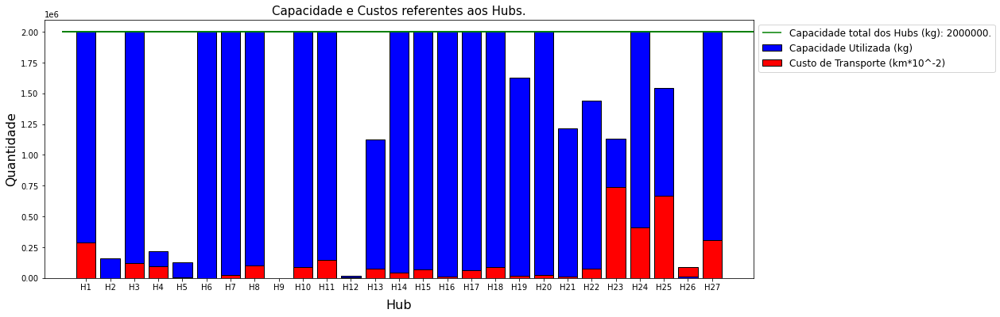

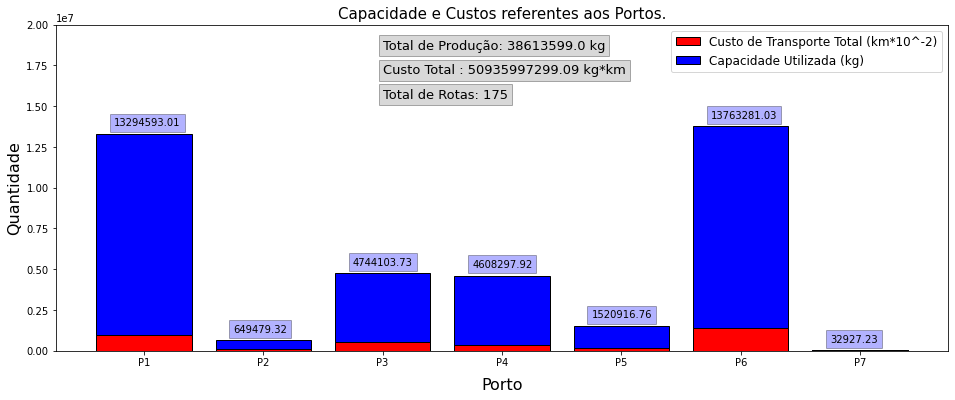

In [ ]:
import matplotlib.pyplot as plt

t_inh={} #dicionário que vai comportar o nome do hub, o tanto que ele recebeu e o tanto que isso custou.
t_inp={} #dicionário que vai comportar o nome do porto, o tanto que ele recebeu e o tanto que isso custou.
for k in range(num_hub):
    t_inh[f"Hub {k+1}"]=round(sum(x[i, k].solution_value() for i in range(num_cit)),2), round(np.sum(costsh[k]),2)*10**2

# print(t_inh)
for j in range(num_por):
  t_inp[f"Porto {j+1}"]=round(sum(y[k, j].solution_value() for k in range(num_hub)),2),round(np.sum(costsp[j]),2)*10**2

# print(t_inp)

plt.figure(1,figsize=[16,6])


plt.title("Capacidade e Custos referentes aos Hubs.",fontsize=15)
plt.xlabel("Hub",labelpad=10,fontsize=16)
plt.ylabel("Quantidade",fontsize=16)
plt.hlines(cap,-1,40,colors="green",label=f"Capacidade total dos Hubs (kg): {cap[0]}.")
plt.legend(bbox_to_anchor=(1,1) ,fontsize=12)

# for i in range(0,12):
#   plt.text(i+0.75, ltempo[i]-2000, str(ltempo[i]),fontsize=10,bbox=dict(facecolor='grey',alpha=0.75))


for i in range(0,num_hub):
  if t_inh[f'Hub {i+1}'][0]>t_inh[f'Hub {i+1}'][1]:
    caph=plt.bar(f'H{i+1}',t_inh[f'Hub {i+1}'][0],edgecolor='black',color='blue')
    cosh=plt.bar(f'H{i+1}',t_inh[f'Hub {i+1}'][1],edgecolor='black',color='red')
  else:
    cosh=plt.bar(f'H{i+1}',t_inh[f'Hub {i+1}'][1],color='red',edgecolor='black')
    caph=plt.bar(f'H{i+1}',t_inh[f'Hub {i+1}'][0],color='blue',edgecolor='black')
caph.set_label('Capacidade Utilizada (kg)')
cosh.set_label('Custo de Transporte (km*10^-2)')

plt.legend(bbox_to_anchor=(1,1) ,fontsize=12)

plt.figure(2,figsize=[16,6])
plt.title("Capacidade e Custos referentes aos Portos.",fontsize=15)
plt.xlabel("Porto",labelpad=10,fontsize=16)
plt.ylabel("Quantidade",fontsize=16)
plt.legend(bbox_to_anchor=(1,1) ,fontsize=12)



for j in range(0,num_por):
  if t_inp[f'Porto {j+1}'][0]>t_inp[f'Porto {j+1}'][1]:
    capp=plt.bar(f'P{j+1}',t_inp[f'Porto {j+1}'][0],color='blue',edgecolor='black')
    cosp=plt.bar(f'P{j+1}',t_inp[f'Porto {j+1}'][1],color='red',edgecolor='black')
  else:
    cosp=plt.bar(f'P{j+1}',t_inp[f'Porto {j+1}'][1],color='red',edgecolor='black')
    capp=plt.bar(f'P{j+1}',t_inp[f'Porto {j+1}'][0],color='blue',edgecolor='black')

capp.set_label('Capacidade Utilizada (kg)')
cosp.set_label('Custo de Transporte Total (km*10^-2)')
for j in range(0,7):
  plt.text(j-0.25, t_inp[f'Porto {j+1}'][0]+500000, str(t_inp[f'Porto {j+1}'][0]),fontsize=10,bbox=dict(facecolor='blue',alpha=0.3))

plt.text(2, 18500000, 'Total de Produção: '+str(total_producao)+ " kg",fontsize=13,bbox=dict(facecolor='grey',alpha=0.3))
plt.text(2, 17000000, 'Custo Total : '+str(round(solver.Objective().Value(),2))+ " kg*km",fontsize=13,bbox=dict(facecolor='grey',alpha=0.3))
plt.text(2, 15500000, 'Total de Rotas: '+str(numf),fontsize=13,bbox=dict(facecolor='grey',alpha=0.3))
plt.ylim(0,2e7)
plt.legend(bbox_to_anchor=(1,1) ,fontsize=12)

plt.show()



#13. Construindo tabela com fluxo e geolocalização

#13.1. De produção para hubs

In [ ]:
inflow = []
for i in range(num_cit):
  for j in range(num_hub):
    aux = []
    dados_fluxo   = x[i,j].solution_value()

    # Só armazenar dados de arcos com fluxo.

    if (dados_fluxo > 0):
      dados_origem  = list(final_producao.loc[i,['nome','latitude', 'longitude']])
      dados_destino = list(final_hubs.loc[j,['nome','latitude', 'longitude']])
      aux.extend(dados_origem)
      aux.append(dados_fluxo)

      aux.extend(dados_destino)

      inflow.append(aux)
#cria-se um data frame que armazena a cidade de origem o hub de destino, suas coordenadas, e o quanto foi transportado.
df_inflow = pd.DataFrame(inflow)
df_inflow

,0,1,2,3,4,5,6
0,Água Boa,-14.05100,-52.1601,423807.0,São Simão,-21.47320,-47.5518
1,Água Boa,-14.05100,-52.1601,260193.0,Araguari,-18.64560,-48.1934
2,Alta Floresta,-9.86674,-56.0867,107930.0,Alta Floresta,-9.86674,-56.0867
3,Alto Araguaia,-17.31530,-53.2181,153900.0,São Simão,-21.47320,-47.5518
4,Alto Boa Vista,-11.67320,-51.3883,122850.0,Bom Jesus do Araguaia,-12.17060,-51.5032
...,...,...,...,...,...,...,...
139,Torixoréu,-16.20060,-52.5571,81477.0,São Simão,-21.47320,-47.5518
140,União do Sul,-11.53080,-54.3616,207155.0,Gaúcha do Norte,-13.24430,-53.0809
141,Vera,-12.30170,-55.3045,524160.0,Sinop,-11.86040,-55.5091
142,Vila Bela da Santíssima Trindade,-15.00680,-59.9504,162098.0,Vila Bela da Santíssima Trindade,-15.00680,-59.9504


#13.2. De hubs para portos


In [ ]:
outflow = []
for i in range(num_hub):
  for j in range(num_por):
    aux = []
    dados_fluxo   = y[i,j].solution_value()

    # Só armazenar dados de arcos com fluxo.
    if (dados_fluxo > 0):
      dados_origem  = list(final_hubs.loc[i,['nome','latitude', 'longitude']])
      dados_destino = list(final_portos.loc[j,['nome','latitude', 'longitude']])
      aux.extend(dados_origem)
      aux.append(dados_fluxo)
      #print('j = ', j)
      aux.extend(dados_destino)
      #print(aux)
      outflow.append(aux)
#cria-se um data frame que armazena o hub de origem o porto de destino, suas coordenadas, e o quanto foi transportado.

df_outflow = pd.DataFrame(outflow)
df_outflow

,0,1,2,3,4,5,6
0,Alta Floresta,-9.86674,-56.0867,2.000000e+06,Manaus,-3.11866,-60.0212
1,Vila Bela da Santíssima Trindade,-15.00680,-59.9504,1.620980e+05,Manaus,-3.11866,-60.0212
2,Alto Garças,-16.94620,-53.5272,2.000000e+06,Paranaguá,-25.51610,-48.5225
3,Cáceres,-16.07640,-57.6818,2.172430e+05,Paranaguá,-25.51610,-48.5225
4,Nortelândia,-14.45400,-56.7945,1.244690e+05,Paranaguá,-25.51610,-48.5225
5,Sorriso,-12.54250,-55.7211,2.000000e+06,Manaus,-3.11866,-60.0212
6,Nova Maringá,-13.01360,-57.0908,2.000000e+06,Manaus,-3.11866,-60.0212
7,Brasnorte,-12.14740,-57.9833,2.000000e+06,Manaus,-3.11866,-60.0212
8,Nova Canaã do Norte,-10.55800,-55.9530,2.000000e+06,Manaus,-3.11866,-60.0212
9,Santo Antônio do Leverger,-15.86320,-56.0788,2.000000e+06,Paranaguá,-25.51610,-48.5225


#14. Criação do mapa de fluxos

#14.1 Mapa com apenas os fluxos.

In [ ]:
from folium.features import DivIcon
import math

#Criação de uma função que desenha os nós de localização das cidades, hubs e portos.

def draw_nodes(df_final, color, fg):
  # Drawing production nodes.
  for index,row in df_final.iterrows():
    number = index + 1
    pop = (row['nome']).encode('latin-1')
    xlat = row['latitude']
    xlon = row['longitude']
    col = color
    fg  = fg

    folium.CircleMarker(location=[xlat, xlon], radius=10,
                        color=col, fill = True, fill_color=col).add_to(fg)

    folium.Marker(location=[xlat, xlon], popup = pop, icon=DivIcon(icon_size=(150,36), icon_anchor=(10,30),
          html='<b><div style="font-size: 11pt; color : {}">{}</div></b>'.format(col,
                                                                          number))).add_to(fg)
#Cria-se uma função para fazer as ligações entre os pontos.

def draw_branches(df_flow, color, fg):
  # Drawing branches.
  for index,row in df_flow.iterrows():
    xlat  = row[1]
    xlon  = row[2]
    ylat  = row[5]
    ylon  = row[6]
    text = row[3]
    stext = str(text) + "(ton)"
    nflow = float(text)/1000
    nflow = math.log(nflow)
    folium.PolyLine([[xlat, xlon], [ylat, ylon]], weight=(nflow), color=color, popup=stext).add_to(fg)


map = folium.Map(location=[-22.7864889,-50.6786708],zoom_start=4,
                 tiles='Stamen Toner')


fg1 = folium.FeatureGroup(name = "Production")
fg2 = folium.FeatureGroup(name = "Hubs")
fg3 = folium.FeatureGroup(name = "Ports")
fg4 = folium.FeatureGroup(name = "Flow X")
fg5 = folium.FeatureGroup(name = "Flow Y")

# Drawing production nodes.
draw_nodes(final_producao, '#3186cc', fg1)
# Drawing hub nodes.
draw_nodes(final_hubs, '#EAD300', fg2)
# Drawing port nodes.
draw_nodes(final_portos, '#FF011F', fg3)

# Draw inflow branches.
draw_branches(df_inflow, '#3186cc', fg4)
# Draw outflow branches.
draw_branches(df_outflow, '#EAD300', fg5)


map.add_child(fg1)
map.add_child(fg2)
map.add_child(fg3)
map.add_child(fg4)
map.add_child(fg5)

map.add_child(folium.LayerControl())
map


#14.2 Mapa acom os fluxos e dados da produção.

In [ ]:
from folium.features import DivIcon
import math

def draw_nodes(df_final, color, fg):
  # Drawing production nodes.
  for index,row in df_final.iterrows():
    number = index + 1
    pop = (row['nome']).encode('latin-1')
    xlat = row['latitude']
    xlon = row['longitude']
    col = color
    fg  = fg

    folium.CircleMarker(location=[xlat, xlon], radius=10,
                        color=col, fill = True, fill_color=col).add_to(fg)

    folium.Marker(location=[xlat, xlon], popup = pop, icon=DivIcon(icon_size=(150,36), icon_anchor=(10,30),
          html='<b><div style="font-size: 11pt; color : {}">{}</div></b>'.format(col,
                                                                          number))).add_to(fg)

def draw_branches(df_flow, color, fg):
  # Drawing branches.
  for index,row in df_flow.iterrows():
    xlat  = row[1]
    xlon  = row[2]
    ylat  = row[5]
    ylon  = row[6]
    text = row[3]
    stext = str(text) + "(ton)"
    nflow = float(text)/1000
    nflow = math.log(nflow)
    folium.PolyLine([[xlat, xlon], [ylat, ylon]], weight=(nflow), color=color, popup=stext).add_to(fg)


map = folium.Map(location=[-22.7864889,-50.6786708],zoom_start=4,
                 tiles='Stamen Toner')

#---------------------------------------------#
# ADIÇÃO
#---------------------------------------------#
fgp = folium.FeatureGroup(name='PRODUÇÃO')
#---------------------------------------------#
fg1 = folium.FeatureGroup(name = "Production")
fg2 = folium.FeatureGroup(name = "Hubs")
fg3 = folium.FeatureGroup(name = "Ports")
fg4 = folium.FeatureGroup(name = "Flow X")
fg5 = folium.FeatureGroup(name = "Flow Y")

# Drawing production nodes.
draw_nodes(final_producao, '#3186cc', fg1)
# Drawing hub nodes.
draw_nodes(final_hubs, '#EAD300', fg2)
# Drawing port nodes.
draw_nodes(final_portos, '#FF011F', fg3)

# Draw inflow branches.
draw_branches(df_inflow, '#3186cc', fg4)
# Draw outflow branches.
draw_branches(df_outflow, '#EAD300', fg5)

#---------------------------------------------#
# ADIÇÃO
#---------------------------------------------#
tooltip=folium.features.GeoJsonTooltip(
        fields=['codarea','PRODUÇÃO'],
        aliases=['codarea','PRODUÇÃO'],
        style=("background-color: white; color: #333333; font-family: arial; font-size: 12px; padding: 10px;")
)

fgp.add_child(folium.GeoJson(data=municipios_json,
                             tooltip=tooltip,
                             style_function = lambda x:{'fillColor':colormap(x['properties']['PRODUÇÃO']),
                                                      'fillcolor':'#black','fillOpacity':0.8,'weight':0.8}))

map.add_child(fgp)
#---------------------------------------------#
map.add_child(fg1)
map.add_child(fg2)
map.add_child(fg3)
map.add_child(fg4)
map.add_child(fg5)

map.add_child(folium.LayerControl())
map

#Em vermelho estão os portos, em Amarelo os Hubs e em azul os municípios.

#15 e 16: Salvando e baixando o mapa

In [ ]:
# map.save(outfile='map.html')

In [ ]:
# from google.colab import files
# files.download('map.html')